In [5]:
from ast import literal_eval
import pandas as pd
import networkx as nx
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
from community import community_louvain as community

In [6]:
#read house_members_116 from csv: members
members = pd.read_csv('house_members_116.csv', index_col = 0)

#converts values of relevant columns to lists of strings rather than strings
members.committee_assignments = members.committee_assignments.apply(literal_eval)

members.head()

,name,state,url,chamber,current_party,committee_assignments
name_id,,,,,,
A000374,ralph-abraham,Louisiana,https://www.congress.gov/member/ralph-abraham/...,House,Republican,"[Agriculture, Armed Services]"
A000370,alma-adams,North Carolina,https://www.congress.gov/member/alma-adams/A00...,House,Democratic,"[Agriculture, Education and Labor, Financial S..."
A000055,robert-aderholt,Alabama,https://www.congress.gov/member/robert-aderhol...,House,Republican,[Appropriations]
A000371,pete-aguilar,California,https://www.congress.gov/member/pete-aguilar/A...,House,Democratic,"[Appropriations, House Administration]"
A000372,rick-allen,Georgia,https://www.congress.gov/member/rick-allen/A00...,House,Republican,"[Agriculture, Education and Labor]"


In [7]:
#bills : dataframe containing information related to bills and resolutions introduced in the 116th House of Representatives as of the latest update

#read house_legislation_116 from csv: bills
bills = pd.read_csv('house_legislation_116.csv', index_col = 0, parse_dates=["date_introduced"])

#converts values of relevant columns to lists of strings rather than strings
bills.cosponsors=bills.cosponsors.apply(literal_eval)
bills.subjects = bills.subjects.apply(literal_eval)
bills.committees = bills.committees.apply(literal_eval)
bills.related_bills = bills.related_bills.apply(literal_eval)

bills.head()

,title,sponsor,cosponsors,related_bills,policy_area,subjects,committees,bill_progress,summary,date_introduced,number,bill_type
bill_id,,,,,,,,,,,,
H.R.1,"To expand Americans' access to the ballot box,...",S001168,"[P000197, A000370, A000376, B001300, B001281, ...","[H.R.44, H.R.93, H.R.137, H.R.138, H.R.196, H....",Government Operations and Politics,"[Administrative law and regulatory procedures,...","[House Administration, House Intelligence (Per...",Passed House,"This bill addresses voter access, election int...",2019-01-03,1,H.R.
H.R.3,"To establish a fair price negotiation program,...",P000034,"[N000015, S000185, L000557, K000382, D000197, ...","[H.R.4619, H.R.4649, H8607, H.R.4663]",Health,[],"[House Energy and Commerce, House Ways and Mea...",Introduced,This bill establishes several programs and req...,2019-09-19,3,H.R.
H.R.4,To amend the Voting Rights Act of 1965 to revi...,S001185,"[L000287, P000197, H000874, C000537, L000570, ...","[H.R.1799, S.561]",Government Operations and Politics,"[Civil actions and liability, Elections, votin...",[House Judiciary],Introduced,NaN,2019-02-26,4,H.R.
H.R.5,To prohibit discrimination on the basis of sex...,C001084,"[F000466, C001119, D000629, H001087, M001185, ...","[H.Res.377, S.788]","Civil Rights and Liberties, Minority Issues","[Civil actions and liability, Consumer credit,...","[House Judiciary, House Education and Labor, H...",Passed House,This bill prohibits discrimination based on se...,2019-03-13,5,H.R.
H.R.6,To authorize the cancellation of removal and a...,R000486,"[V000081, C001067, A000371, B001300, C001112, ...","[H.R.2820, H.R.2821, H.Res.415, S.874]",Immigration,"[Administrative law and regulatory procedures,...","[House Judiciary, House Education and Labor]",Passed House,This bill cancels and prohibits removal procee...,2019-03-12,6,H.R.


### Exploratory Data Analysis

### Number of Members by Current Party

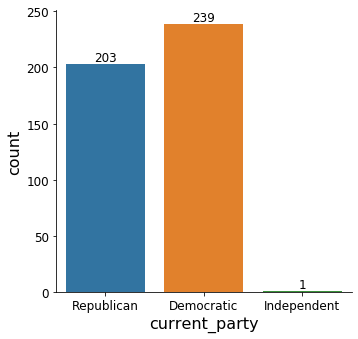

In [8]:
import seaborn as sns
import math

rc={'font.size': 16, 'axes.labelsize': 16, 'legend.fontsize': 16, 
    'axes.titlesize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12}
plt.rcParams.update(**rc)
sns.catplot(x="current_party", data=members, kind="count")

# Get current axis on current figure
ax = plt.gca()


# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')

Committee assignments of current party

In [9]:
#break the 'commmittee_assignments' list to separate elements

lst_col = 'committee_assignments'

memberseda = members

r = pd.DataFrame({
      col:np.repeat(memberseda[col].values, memberseda[lst_col].str.len())
      for col in memberseda.columns.drop(lst_col)}
    ).assign(**{lst_col:np.concatenate(memberseda[lst_col].values)})[memberseda.columns]

r.head(5)

,name,state,url,chamber,current_party,committee_assignments
0,ralph-abraham,Louisiana,https://www.congress.gov/member/ralph-abraham/...,House,Republican,Agriculture
1,ralph-abraham,Louisiana,https://www.congress.gov/member/ralph-abraham/...,House,Republican,Armed Services
2,alma-adams,North Carolina,https://www.congress.gov/member/alma-adams/A00...,House,Democratic,Agriculture
3,alma-adams,North Carolina,https://www.congress.gov/member/alma-adams/A00...,House,Democratic,Education and Labor
4,alma-adams,North Carolina,https://www.congress.gov/member/alma-adams/A00...,House,Democratic,Financial Services


In [10]:
r.committee_assignments.unique()

array(['Agriculture', 'Armed Services', 'Education and Labor',
       'Financial Services', 'Appropriations', 'House Administration',
       'Foreign Affairs', 'Transportation and Infrastructure',
       "Veterans' Affairs", 'Judiciary', 'Oversight and Reform',
       'Select Committee on the Climate Crisis', 'Ways and Means',
       'Science, Space, and Technology', 'Small Business',
       'Energy and Commerce', 'Homeland Security', 'Natural Resources',
       'Budget', 'Select Committee on the Modernization of Congress',
       'Ethics', 'Rules', 'Permanent Select Committee on Intelligence',
       'Select Committee on the Climate Crisis, Chair', 'Majority Whip',
       'Rules, Ranking Member', 'Oversight and Reform, Chair',
       'House Administration, Ranking Member',
       'Transportation and Infrastructure, Chair', 'Ethics, Chair',
       'Foreign Affairs, Chair',
       'Select Committee on the Modernization of Congress, Vice Chair',
       'Natural Resources, Chair', 'Majori

In [11]:
r['committee_assignments_new']=r['committee_assignments'].str.split(',').str[0]
r.committee_assignments_new.unique()
## Science, Space, and Technology will be called Science as it contains many commas

array(['Agriculture', 'Armed Services', 'Education and Labor',
       'Financial Services', 'Appropriations', 'House Administration',
       'Foreign Affairs', 'Transportation and Infrastructure',
       "Veterans' Affairs", 'Judiciary', 'Oversight and Reform',
       'Select Committee on the Climate Crisis', 'Ways and Means',
       'Science', 'Small Business', 'Energy and Commerce',
       'Homeland Security', 'Natural Resources', 'Budget',
       'Select Committee on the Modernization of Congress', 'Ethics',
       'Rules', 'Permanent Select Committee on Intelligence',
       'Majority Whip', 'Majority Leader',
       'Senior Chief Deputy Majority Whip', 'Assistant Speaker',
       'Minority Leader', 'The Speaker', 'Minority Whip'], dtype=object)

In [12]:
# rename Science back to Science Space & Tech
r.committee_assignments_new=['Science Space & Tech' if x=='Science' else x for x in r.committee_assignments_new]
r.committee_assignments_new.unique()

array(['Agriculture', 'Armed Services', 'Education and Labor',
       'Financial Services', 'Appropriations', 'House Administration',
       'Foreign Affairs', 'Transportation and Infrastructure',
       "Veterans' Affairs", 'Judiciary', 'Oversight and Reform',
       'Select Committee on the Climate Crisis', 'Ways and Means',
       'Science Space & Tech', 'Small Business', 'Energy and Commerce',
       'Homeland Security', 'Natural Resources', 'Budget',
       'Select Committee on the Modernization of Congress', 'Ethics',
       'Rules', 'Permanent Select Committee on Intelligence',
       'Majority Whip', 'Majority Leader',
       'Senior Chief Deputy Majority Whip', 'Assistant Speaker',
       'Minority Leader', 'The Speaker', 'Minority Whip'], dtype=object)

### Members by Committee Assignment 

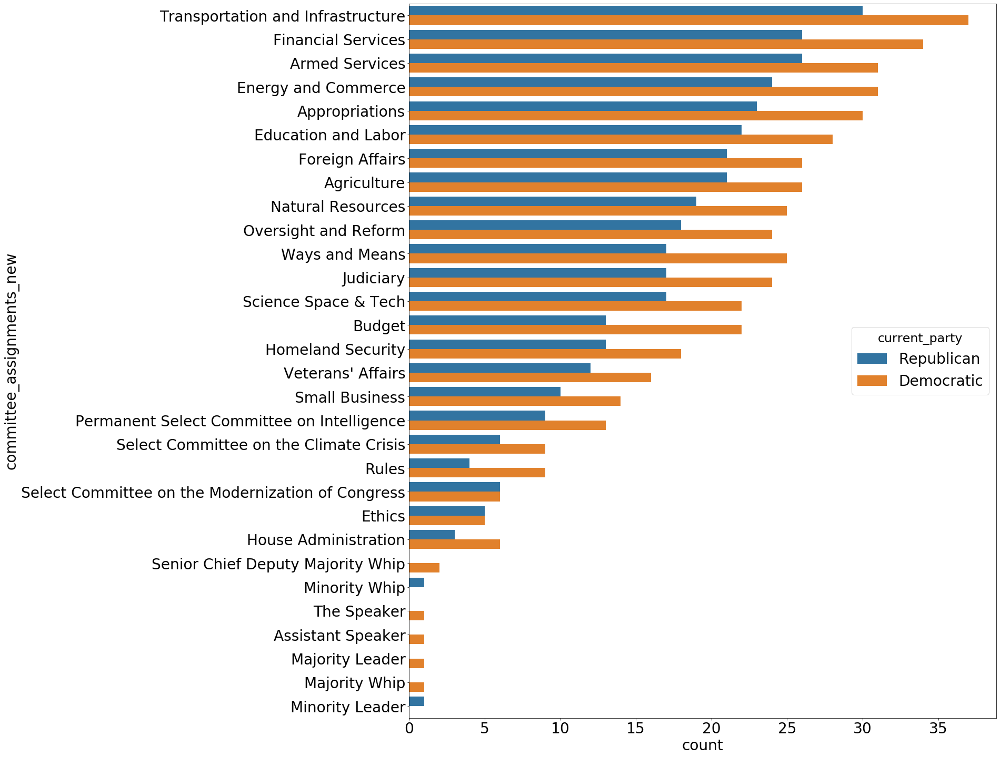

In [13]:
rc={'font.size': 28, 'axes.labelsize': 28, 'legend.fontsize': 28, 
    'axes.titlesize': 28, 'xtick.labelsize': 28, 'ytick.labelsize': 28}
plt.rcParams.update(**rc)

plt.figure(figsize=(20,25))
sns.countplot(y="committee_assignments_new", hue="current_party", data=r,
              order=r.committee_assignments_new.value_counts().iloc[:].index)

In [14]:
r.committee_assignments =['Science Space & Tech, Chair' if x=='Science, Space, and Technology, Chair' else x for x in r.committee_assignments]
r.committee_assignments =['Science Space & Tech' if x=='Science, Space, and Technology' else x for x in r.committee_assignments]
r.committee_assignments =['Science Space & Tech, Ranking Member' if x=='Science, Space, and Technology, Ranking Member' else x for x in r.committee_assignments]
r['committee_assignments_chair']=r['committee_assignments'].str.split(',').str[1]
r.committee_assignments_chair.unique()

array([nan, ' Chair', ' Ranking Member', ' Vice Chair', ' Chairperson',
       ' Chairman'], dtype=object)

### Committee Leaders by Policy Area and Party Type

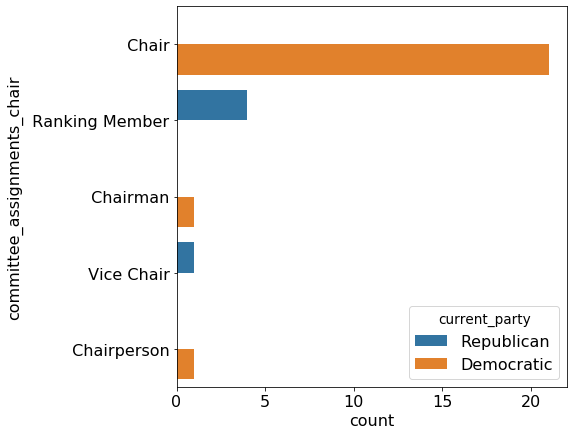

In [15]:
rc={'font.size': 16, 'axes.labelsize': 16, 'legend.fontsize': 16, 
    'axes.titlesize': 16, 'xtick.labelsize': 16, 'ytick.labelsize': 16}
plt.rcParams.update(**rc)

plt.figure(figsize=(7,7))
sns.countplot(y="committee_assignments_chair", hue="current_party", data=r,
              order=r.committee_assignments_chair.value_counts().iloc[:].index)

Bill Policy Areas and Sponsor by Party 

In [16]:
#merge bills and members dataframes
sponsor = bills.merge(members, left_on='sponsor', right_index=True, how='left')
sponsor.head()

,title,sponsor,cosponsors,related_bills,policy_area,subjects,committees,bill_progress,summary,date_introduced,number,bill_type,name,state,url,chamber,current_party,committee_assignments
bill_id,,,,,,,,,,,,,,,,,,
H.R.1,"To expand Americans' access to the ballot box,...",S001168,"[P000197, A000370, A000376, B001300, B001281, ...","[H.R.44, H.R.93, H.R.137, H.R.138, H.R.196, H....",Government Operations and Politics,"[Administrative law and regulatory procedures,...","[House Administration, House Intelligence (Per...",Passed House,"This bill addresses voter access, election int...",2019-01-03,1,H.R.,john-sarbanes,Maryland,https://www.congress.gov/member/john-sarbanes/...,House,Democratic,"[Energy and Commerce, Oversight and Reform]"
H.R.3,"To establish a fair price negotiation program,...",P000034,"[N000015, S000185, L000557, K000382, D000197, ...","[H.R.4619, H.R.4649, H8607, H.R.4663]",Health,[],"[House Energy and Commerce, House Ways and Mea...",Introduced,This bill establishes several programs and req...,2019-09-19,3,H.R.,frank-pallone,New Jersey,https://www.congress.gov/member/frank-pallone/...,House,Democratic,"[Energy and Commerce, Chair]"
H.R.4,To amend the Voting Rights Act of 1965 to revi...,S001185,"[L000287, P000197, H000874, C000537, L000570, ...","[H.R.1799, S.561]",Government Operations and Politics,"[Civil actions and liability, Elections, votin...",[House Judiciary],Introduced,NaN,2019-02-26,4,H.R.,terri-sewell,Alabama,https://www.congress.gov/member/terri-sewell/S...,House,Democratic,"[Ways and Means, Permanent Select Committee on..."
H.R.5,To prohibit discrimination on the basis of sex...,C001084,"[F000466, C001119, D000629, H001087, M001185, ...","[H.Res.377, S.788]","Civil Rights and Liberties, Minority Issues","[Civil actions and liability, Consumer credit,...","[House Judiciary, House Education and Labor, H...",Passed House,This bill prohibits discrimination based on se...,2019-03-13,5,H.R.,david-cicilline,Rhode Island,https://www.congress.gov/member/david-cicillin...,House,Democratic,"[Foreign Affairs, Judiciary]"
H.R.6,To authorize the cancellation of removal and a...,R000486,"[V000081, C001067, A000371, B001300, C001112, ...","[H.R.2820, H.R.2821, H.Res.415, S.874]",Immigration,"[Administrative law and regulatory procedures,...","[House Judiciary, House Education and Labor]",Passed House,This bill cancels and prohibits removal procee...,2019-03-12,6,H.R.,lucille-roybal-allard,California,https://www.congress.gov/member/lucille-roybal...,House,Democratic,[Appropriations]


sponsor by current party

### Bills by Current Party of Sponsor 

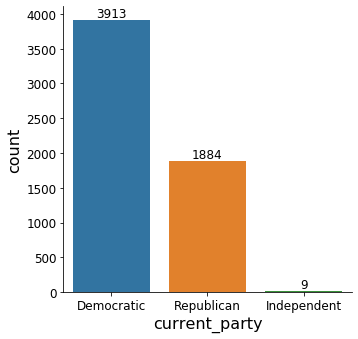

In [17]:
rc={'font.size': 16, 'axes.labelsize': 16, 'legend.fontsize': 16, 
    'axes.titlesize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12}
plt.rcParams.update(**rc)
sns.catplot(x='current_party', data=sponsor, kind="count")

# Get current axis on current figure
ax = plt.gca()


# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')

### Bills Introduced by Policy Area and Current Party of Sponsor

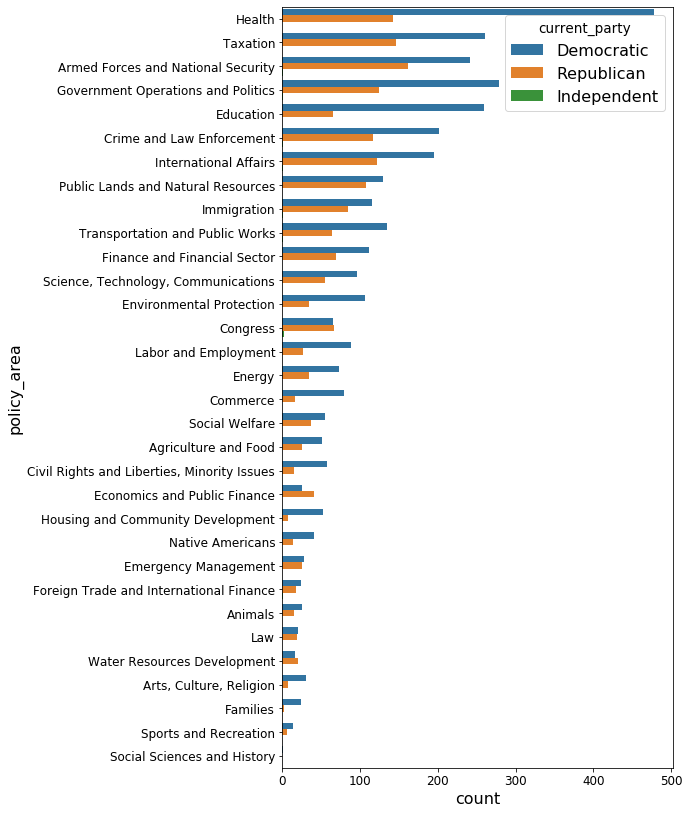

In [18]:
bill_introduced = sponsor['bill_progress'] == 'Introduced'

rc={'font.size': 16, 'axes.labelsize': 16, 'legend.fontsize': 16, 
    'axes.titlesize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12}
plt.rcParams.update(**rc)

plt.figure(figsize=(7,14))
sns.countplot(y="policy_area", hue="current_party", data=sponsor[bill_introduced],
              order=sponsor.policy_area[bill_introduced].value_counts().iloc[:].index)

### Bills Passed by Policy Area and Current Party of Sponsor

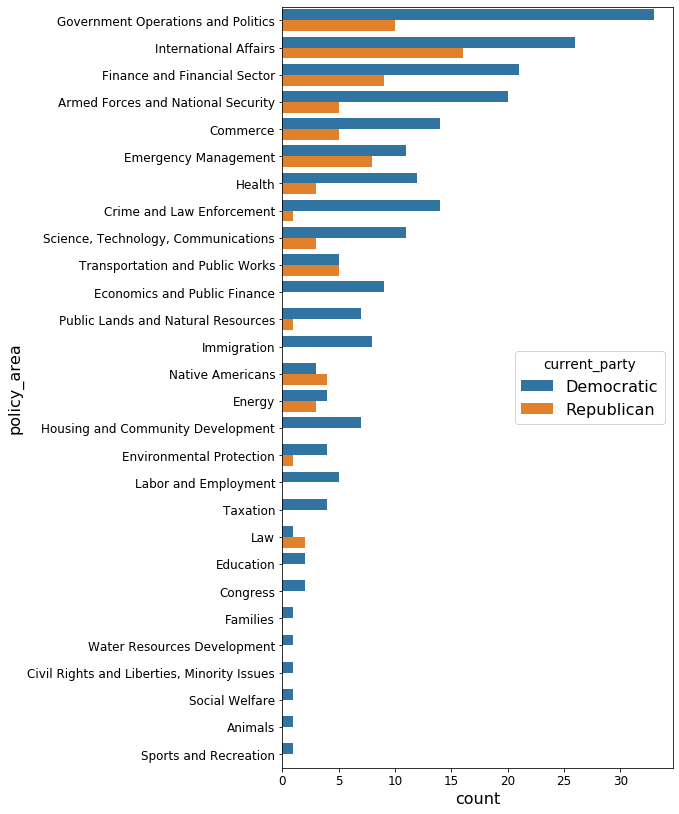

In [19]:
bill_passed = sponsor['bill_progress'] == 'Passed House'

rc={'font.size': 16, 'axes.labelsize': 16, 'legend.fontsize': 16, 
    'axes.titlesize': 16, 'xtick.labelsize': 12, 'ytick.labelsize': 12}
plt.rcParams.update(**rc)

plt.figure(figsize=(7,14))
sns.countplot(y="policy_area", hue="current_party", data=sponsor[bill_passed],
              order=sponsor.policy_area[bill_passed].value_counts().iloc[:].index)

### Create Sponsor/Cosponsor Networks


In [68]:
# MD: graph with directed edges from bill cosponsors to a bill sponsor
MD = nx.MultiDiGraph()
MD.add_nodes_from(members.index)
for index, row in bills.iterrows():
    sponsor = [row.sponsor for i in range(len(row.cosponsors))]
    zipped = zip(row.cosponsors, sponsor)
    zipped = list(zipped)
    
    #set edge attribute related to bill policy_area
    MD.add_edges_from(zipped, bill = index, policy_area = row.policy_area, bill_progress = row.bill_progress)

#drop nodes representing non-voting members, former members and the Speaker of the House
to_drop =['G000582', 'R000600', 'N000147', 'P000610', 'S001177', 'S001204', 'P000197', 'J000255']
MD.remove_nodes_from(to_drop)

# set node attrbute 'party'
nx.set_node_attributes(MD,  members.current_party.to_dict(), 'party')


#convert MD from a multi-directed graph to graph with weighted edges, with weights representing the number of edges between two nodes
G = nx.Graph()

for n, nbrs in MD.adjacency():
    for nbr, edict in nbrs.items():
        if (G.has_edge(n,nbr)) :
            G[n][nbr]['weight'] +=len(edict)
        else:
             G.add_edge(n, nbr, weight=len(edict))


## Community detection by Louvain Clustering (Overall)

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:569: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaco

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: 
The is_numlike function was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use isinstance(..., numbers.Number) instead.
  if cb.is_numlike(alpha):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:569: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

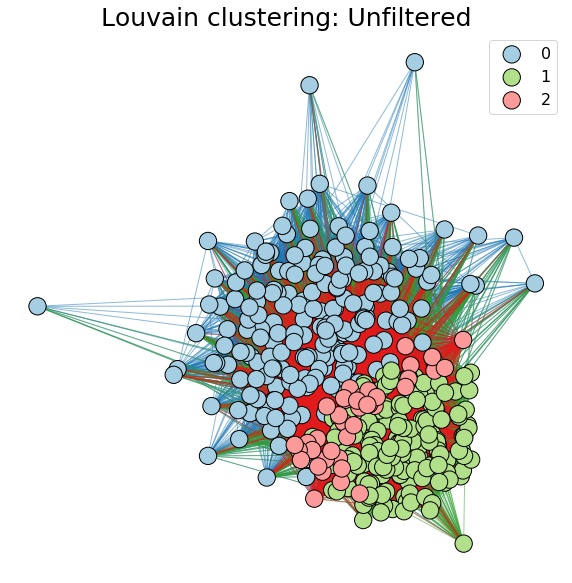

In [70]:
##Community Detection by Louvain Clustering

# function for setting colors of nodes and edges
def get_paired_color_palette(size):
    palette = []
    for i in range(size*2):
        palette.append(plt.cm.Paired(i))
    return palette

#use louvain community detection algorithm to detect communities in G
communities =[]
louvain = community.best_partition(G, weight = 'weight', random_state=42)
for i in set(louvain.values()):
    nodelist = [n for n in G.nodes if (louvain[n]==i)]
    communities.append(nodelist)
    
#make plot using matplotlib, networkx spring_layout, set_colors using cluster_count and get_paired_color_pallette
clusters_count = len(set(louvain.values()))
plt.figure(figsize=(10, 10))
light_colors = get_paired_color_palette(clusters_count)[0::2]
dark_colors = get_paired_color_palette(clusters_count)[1::2]
g = nx.drawing.layout.spring_layout(G, weight = 'weight', seed = 42, threshold = .0000000001)

for i in set(louvain.values()):
    nodelist = [n for n in G.nodes if (louvain[n]==i)]
    edgelist = [e for e in G.edges if ((louvain[e[0]]==i) or (louvain[e[1]]==i))]
    node_color = [light_colors[i] for _ in range(len(nodelist))]
    edge_color = [dark_colors[i] for _ in range(len(edgelist))]
    nx.draw_networkx_nodes(G, g, nodelist=nodelist, node_color=node_color, edgecolors='k', label = i)                                                                                                           
    nx.draw_networkx_edges(G, g, edgelist=edgelist, alpha=.5, edge_color=edge_color)

plt.title('Louvain clustering: Unfiltered', fontdict={'fontsize': 25})
plt.legend()
plt.axis('off')
plt.show()


##According to the plot, the community detection algorithm identified three communities. 
#Republicans are mostly identified with community 0, 
#whereas Democtrats are split between communities 1 and 2.

## Key players detection by Centrality

In [71]:
##So who are the key Influencers among the commnunity 0- Republicans(Based on Centrality)

#set community_of_interest
community_of_interest =0

#create subgraph with nodes limited to the community_of_interest
subgraph0 = MD.subgraph(communities[community_of_interest])

print('\nKey players by in-degree centrality for group 0:')
#sort members of community_of_interest by in_degreee centrality
pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph0), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False).head(10)


#The table is sorted in descending order based on the in_degree centrality of members within community 0, 
#which is mostly composed of Republicans. According to the table the five most important members of this community 
#as measured by centrality are Ron Kind, Andy Biggs, Christopher Smith, Terri Sewell and Vicky Hartzler. 
#Interestingly,two Democrats are within the top five centrality scores.


Key players by in-degree centrality for group 0:


,centrality,name,current_party,committee_assignments
K000188,3.054187,ron-kind,Democratic,[Ways and Means]
B001302,3.044335,andy-biggs,Republican,"[Judiciary, Science, Space, and Technology]"
S000522,2.344828,christopher-smith,Republican,[Foreign Affairs]
S001185,1.689655,terri-sewell,Democratic,"[Ways and Means, Permanent Select Committee on..."
H001053,1.605911,vicky-hartzler,Republican,"[Agriculture, Armed Services]"
S001196,1.492611,elise-stefanik,Republican,"[Armed Services, Education and Labor, Permanen..."
W000795,1.428571,joe-wilson,Republican,"[Armed Services, Foreign Affairs]"
S001176,1.413793,steve-scalise,Republican,"[Minority Whip, Energy and Commerce]"
S001195,1.334975,jason-smith,Republican,"[Budget, Ways and Means]"
C001093,1.310345,doug-collins,Republican,[Judiciary]


In [72]:
##So who are the key Influencers among the Democrats- 1st community (Based on Centrality)

#set community_of_interest
community_of_interest = 1

#create subgraph with nodes limited to the community_of_interest
subgraph1 = MD.subgraph(communities[community_of_interest])

print('\nKey players by in-degree centrality for group 1:')
#sort members of community_of_interest by in_degreee centality
pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph1), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False).head(10)





Key players by in-degree centrality for group 1:


,centrality,name,current_party,committee_assignments
C001084,6.289474,david-cicilline,Democratic,"[Foreign Affairs, Judiciary]"
M000087,5.605263,carolyn-maloney,Democratic,"[Financial Services, Oversight and Reform]"
C001080,5.042105,judy-chu,Democratic,"[Small Business, Ways and Means]"
S001175,4.857895,jackie-speier,Democratic,"[Armed Services, Oversight and Reform, Permane..."
L000551,4.831579,barbara-lee,Democratic,"[Appropriations, Budget]"
S000185,4.742105,robert-scott,Democratic,"[Education and Labor, Chair, Budget]"
D000216,4.678947,rosa-delauro,Democratic,"[Appropriations, Budget]"
T000460,4.168421,mike-thompson,Democratic,[Ways and Means]
D000191,3.721053,peter-defazio,Democratic,"[Transportation and Infrastructure, Chair]"
B000574,3.605263,earl-blumenauer,Democratic,[Ways and Means]


In [73]:
##So who are the key Influencers among the Democrats - 2nd community (Based on Centrality)

#set community_of_interest
community_of_interest = 2

#create subgraph with nodes limited to the community_of_interest
subgraph2 = MD.subgraph(communities[community_of_interest])

print('\nKey players by in-degree centrality for group 2:')
#sort members of community_of_interest by in_degreee centality
pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph2), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False).head(10)





Key players by in-degree centrality for group 2:


,centrality,name,current_party,committee_assignments
E000179,4.923077,eliot-engel,Democratic,"[Foreign Affairs, Chair, Energy and Commerce]"
D000610,4.282051,theodore-deutch,Democratic,"[Ethics, Chair, Foreign Affairs, Judiciary]"
K000210,2.435897,peter-king,Republican,"[Financial Services, Homeland Security]"
C001078,2.410256,gerald-connolly,Democratic,"[Foreign Affairs, Oversight and Reform]"
S001190,2.410256,bradley-schneider,Democratic,"[Small Business, Ways and Means]"
R000602,2.153846,kathleen-rice,Democratic,"[Homeland Security, Veterans' Affairs]"
L000562,1.794872,stephen-lynch,Democratic,"[Financial Services, Oversight and Reform, Tra..."
P000096,1.794872,william-pascrell,Democratic,[Ways and Means]
K000381,1.692308,derek-kilmer,Democratic,[Select Committee on the Modernization of Cong...
M001180,1.666667,david-mckinley,Republican,[Energy and Commerce]


In [74]:
group00=pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph0), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'inner', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False)
group11=pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph1), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'inner', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False)
group22=pd.DataFrame.from_dict(nx.algorithms.centrality.in_degree_centrality(subgraph2), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'inner', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False)

g0_d=group00[group00['current_party']=='Democratic'].shape[0]/group00.shape[0]
g0_r=group00[group00['current_party']=='Republican'].shape[0]/group00.shape[0]
g0_i=group00[group00['current_party']=='Independent'].shape[0]/group00.shape[0]

g1_d=group11[group11['current_party']=='Democratic'].shape[0]/group11.shape[0]
g1_r=group11[group11['current_party']=='Republican'].shape[0]/group11.shape[0]
g1_i=group11[group11['current_party']=='Independent'].shape[0]/group11.shape[0]

g2_d=group22[group22['current_party']=='Democratic'].shape[0]/group22.shape[0]
g2_r=group22[group22['current_party']=='Republican'].shape[0]/group22.shape[0]
g2_i=group22[group22['current_party']=='Independent'].shape[0]/group22.shape[0]

g00=pd.DataFrame({'Democratic':[g0_d,g1_d,g2_d],'Republican':[g0_r,g1_r,g2_r],'Independent':[g0_i,g1_i,g2_i]})
g00.index.name='Community'
g00

,Democratic,Republican,Independent
Community,,,
0,0.044118,0.950980,0.004902
1,0.994764,0.005236,0.000000
2,0.875000,0.125000,0.000000


## Key players detection by In-Degree

In [75]:
# key players using degree for community 0
sortdeg = sorted(subgraph0.in_degree, key=lambda x: x[1], reverse=True)
deg =pd.DataFrame(sortdeg).rename(columns={1: "in-degree"})
deg.set_index(0, inplace=True)
print('\nKey players by in-degree for group 0:')
deg.merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'in-degree',ascending = False).head(10)


Key players by in-degree for group 0:


,in-degree,name,current_party,committee_assignments
K000188,620.0,ron-kind,Democratic,[Ways and Means]
B001302,618.0,andy-biggs,Republican,"[Judiciary, Science, Space, and Technology]"
S000522,476.0,christopher-smith,Republican,[Foreign Affairs]
S001185,343.0,terri-sewell,Democratic,"[Ways and Means, Permanent Select Committee on..."
H001053,326.0,vicky-hartzler,Republican,"[Agriculture, Armed Services]"
S001196,303.0,elise-stefanik,Republican,"[Armed Services, Education and Labor, Permanen..."
W000795,290.0,joe-wilson,Republican,"[Armed Services, Foreign Affairs]"
S001176,287.0,steve-scalise,Republican,"[Minority Whip, Energy and Commerce]"
S001195,271.0,jason-smith,Republican,"[Budget, Ways and Means]"
C001093,266.0,doug-collins,Republican,[Judiciary]


## Key players detection by Closeness Centrality

In [77]:
print('\nKey players by Closeness Centrality for group 0:')
pd.DataFrame.from_dict(nx.closeness_centrality(subgraph0), orient = 'index', 
                       columns = ['centrality']).merge(members[['name','current_party', 
                       'committee_assignments']], how = 'outer', left_index = True,
                        right_index = True).sort_values(by= 'centrality',ascending = False).head(10)


Key players by Closeness Centrality for group 0:


,centrality,name,current_party,committee_assignments
K000188,0.962085,ron-kind,Democratic,[Ways and Means]
B001302,0.926941,andy-biggs,Republican,"[Judiciary, Science, Space, and Technology]"
W000812,0.918552,ann-wagner,Republican,"[Financial Services, Foreign Affairs]"
W000795,0.906250,joe-wilson,Republican,"[Armed Services, Foreign Affairs]"
S001185,0.902222,terri-sewell,Democratic,"[Ways and Means, Permanent Select Committee on..."
S000522,0.894273,christopher-smith,Republican,[Foreign Affairs]
S001196,0.845833,elise-stefanik,Republican,"[Armed Services, Education and Labor, Permanen..."
S001176,0.831967,steve-scalise,Republican,"[Minority Whip, Energy and Commerce]"
H001067,0.815261,richard-hudson,Republican,[Energy and Commerce]
H001053,0.799213,vicky-hartzler,Republican,"[Agriculture, Armed Services]"


## Key players detection by Betweenness Centrality

In [33]:
print('\nKey players by Betweenness Centrality for group 0:')
pd.DataFrame.from_dict(nx.betweenness_centrality(subgraph0), orient = 'index', columns = ['Btw-centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'inner', left_index = True, right_index = True).sort_values(by= 'Btw-centrality',ascending = False).head(10)


Key players by Betweenness Centrality for group 0:


,Btw-centrality,name,current_party,committee_assignments
B001302,0.026007,andy-biggs,Republican,"[Judiciary, Science, Space, and Technology]"
W000812,0.021029,ann-wagner,Republican,"[Financial Services, Foreign Affairs]"
H001067,0.020317,richard-hudson,Republican,[Energy and Commerce]
P000613,0.017272,jimmy-panetta,Democratic,"[Agriculture, Budget, Ways and Means]"
S001196,0.017197,elise-stefanik,Republican,"[Armed Services, Education and Labor, Permanen..."
W000795,0.017009,joe-wilson,Republican,"[Armed Services, Foreign Affairs]"
M001195,0.016639,alexander-mooney,Republican,[Financial Services]
K000188,0.014424,ron-kind,Democratic,[Ways and Means]
B001291,0.013497,brian-babin,Republican,"[Science, Space, and Technology, Transportatio..."
S001187,0.012735,steve-stivers,Republican,[Financial Services]


# Analysis for Specific Policy Areas

## Community detection by Louvain Clustering (Health)

In [86]:
#setting policy area (change here)
policy_area = 'Health'

#MDs: subgraph limited to edges filtered by a policy area that is defined above
MDs = nx.MultiDiGraph()

for u,v,d in MD.edges(data = True):
    if d['policy_area'] ==  policy_area:
        MDs.add_edge(u,v,bill = d['bill'])


#convert MDs from a multi-directed graph to graph with weighted edges, with weights representing the number of edges between the nodes
Gs = nx.Graph()

for n, nbrs in MDs.adjacency():
    for nbr, edict in nbrs.items():
        if (Gs.has_edge(n,nbr)) :
            Gs[n][nbr]['weight'] +=len(edict)
        else:
             Gs.add_edge(n, nbr, weight=len(edict))


C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:569: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaco

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



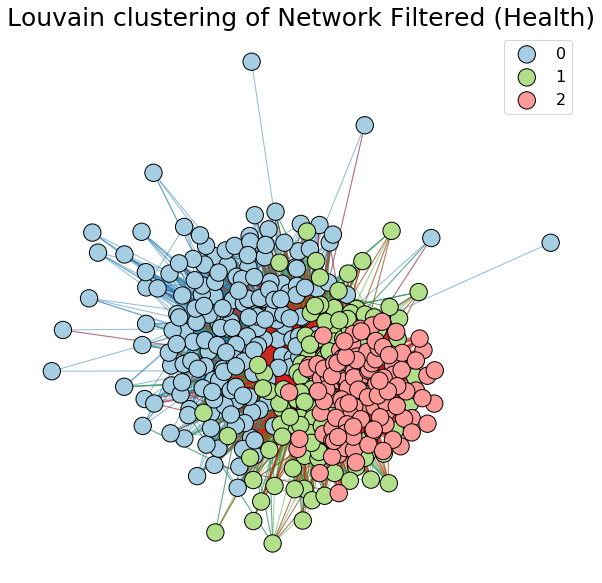

In [87]:
# function for setting colors of nodes and edges
def get_paired_color_palette(size):
    palette = []
    for i in range(size*2):
        palette.append(plt.cm.Paired(i))
    return palette


#use louvain community detection algorithm to detect communities in G
communities =[]
louvain = community.best_partition(Gs, weight = 'weight', random_state=42)
for i in set(louvain.values()):
    nodelist = [n for n in Gs.nodes if (louvain[n]==i)]
    communities.append(nodelist)

#make plot using matplotlib, networkx spring_layout, set_colors using cluster_count and get_paired_color_pallette
clusters_count = len(set(louvain.values()))
plt.figure(figsize=(10, 10))
light_colors = get_paired_color_palette(clusters_count)[0::2]
dark_colors = get_paired_color_palette(clusters_count)[1::2]
g = nx.drawing.layout.spring_layout(Gs, weight = 'weight', seed = 42, threshold = .0000000001)

for i in set(louvain.values()):
    nodelist = [n for n in Gs.nodes if (louvain[n]==i)]
    edgelist = [e for e in Gs.edges if ((louvain[e[0]]==i) or (louvain[e[1]]==i))]
    node_color = [light_colors[i] for _ in range(len(nodelist))]
    edge_color = [dark_colors[i] for _ in range(len(edgelist))]
    nx.draw_networkx_nodes(Gs, g, nodelist=nodelist, node_color=node_color, edgecolors='k', label = i)                                                                                                           
    nx.draw_networkx_edges(Gs, g, edgelist=edgelist, alpha=.5, edge_color=edge_color)

plt.title('Louvain clustering of Network Filtered (' + policy_area + ')', fontdict={'fontsize': 25})
plt.legend()
plt.axis('off')
plt.show()

## List of members not involved in proposal of bills for health policies

In [88]:
df = []
for index, row in members.iterrows():
    if index not in communities[0] and index not in communities[1] and index not in communities[2]:
        df.append(row)

df = pd.DataFrame(df) 
df

,name,state,url,chamber,current_party,committee_assignments
B001311,dan-bishop,North Carolina,https://www.congress.gov/member/dan-bishop/B00...,House,Republican,"[Homeland Security, Small Business]"
G000582,jenniffer-gonzalez-colon,Puerto Rico,https://www.congress.gov/member/jenniffer-gonz...,House,Republican,"[Natural Resources, Transportation and Infrast..."
J000255,walter-jones,North Carolina,https://www.congress.gov/member/walter-jones/J...,House,Republican,[]
M001179,tom-marino,Pennsylvania,https://www.congress.gov/member/tom-marino/M00...,House,Republican,[]
N000147,eleanor-norton,District of Columbia,https://www.congress.gov/member/eleanor-norton...,House,Democratic,"[Oversight and Reform, Transportation and Infr..."
P000197,nancy-pelosi,California,https://www.congress.gov/member/nancy-pelosi/P...,House,Democratic,[The Speaker]
P000610,stacey-plaskett,Virgin Islands,https://www.congress.gov/member/stacey-plasket...,House,Democratic,"[Agriculture, Oversight and Reform, Transporta..."
R000600,aumua-amata-radewagen,American Samoa,https://www.congress.gov/member/aumua-amata-ra...,House,Republican,"[Natural Resources, Small Business, Veterans' ..."
S001177,gregorio-sablan,Northern Mariana Islands,https://www.congress.gov/member/gregorio-sabla...,House,Democratic,"[Education and Labor, Natural Resources, Veter..."
S001204,michael-san-nicolas,Guam,https://www.congress.gov/member/michael-san-ni...,House,Democratic,"[Financial Services, Natural Resources]"


## Key Player Detection (Closeness Centrality)

In [66]:
#set community of interest
community_of_interest = 0

#subgraph: is a subgraph using only nodes contained by the community_of_interest
subgraph = MDs.subgraph(communities[community_of_interest])

#dataframe for nodes of the community of interest sorted by in_degree centrality
pd.DataFrame.from_dict(nx.algorithms.centrality.closeness_centrality(subgraph), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False).head(10)

,centrality,name,current_party,committee_assignments
S000522,0.763713,christopher-smith,Republican,[Foreign Affairs]
H001053,0.726908,vicky-hartzler,Republican,"[Agriculture, Armed Services]"
B001287,0.688213,ami-bera,Democratic,"[Foreign Affairs, Science, Space, and Technology]"
R000599,0.646429,raul-ruiz,Democratic,[Energy and Commerce]
H001052,0.632867,andy-harris,Republican,[Appropriations]
F000450,0.621993,virginia-foxx,Republican,"[Education and Labor, Oversight and Reform]"
C001066,0.595395,kathy-castor,Democratic,"[Select Committee on the Climate Crisis, Chair..."
K000188,0.587662,ron-kind,Democratic,[Ways and Means]
D000617,0.585761,suzan-delbene,Democratic,"[Ways and Means, Select Committee on the Moder..."
B001248,0.569182,michael-burgess,Republican,"[Energy and Commerce, Rules]"


## Graph Breakdown

In [67]:
from decimal import Decimal

c0republican = 0
c0democratic = 0
c0independent = 0

c1republican = 0
c1democratic = 0
c1independent = 0

c2republican = 0
c2democratic = 0
c2independent = 0

c3republican = 0
c3democratic = 0
c3independent = 0

count = 0

for index, row in members.iterrows():
    if index in communities[0]:
        count+=1
        if row.current_party == 'Republican':
            c0republican += 1
            
        if row.current_party == 'Democratic':
            c0democratic += 1
            
        if row.current_party == 'Independent':
            c0independent += 1
print("---Community 0---\n\n")
print("Republicans: "+str(c0republican) + "(" + str(round(100*Decimal(c0republican/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Democrats: "+str(c0democratic) + "(" + str(round(100*Decimal(c0democratic/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Independent: "+str(c0independent) + "(" + str(round(100*Decimal(c0independent/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Total count: "+str(c0republican+c0democratic+c0independent))
print("\n")

for index, row in members.iterrows():
    if index in communities[1]:
        count+=1
        if row.current_party == 'Republican':
            c1republican += 1
            
        if row.current_party == 'Democratic':
            c1democratic += 1
            
        if row.current_party == 'Independent':
            c1independent += 1

print("---Community 1---\n\n")
print("Republicans: "+str(c1republican) + "(" + str(round(100*Decimal(c1republican/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Democrats: "+str(c1democratic) + "(" + str(round(100*Decimal(c1democratic/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Independent: "+str(c1independent) + "(" + str(round(100*Decimal(c1independent/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Total count: "+str(c1republican+c1democratic+c1independent))
print("\n")

for index, row in members.iterrows():
    if index in communities[2]:
        count+=1
        if row.current_party == 'Republican':
            c2republican += 1
            
        if row.current_party == 'Democratic':
            c2democratic += 1
            
        if row.current_party == 'Independent':
            c2independent += 1

print("---Community 2---\n\n")
print("Republicans: "+str(c2republican) + "(" + str(100*round(Decimal(c2republican/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Democrats: "+str(c2democratic) + "(" + str(100*round(Decimal(c2democratic/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Independent: "+str(c2independent) + "(" + str(100*round(Decimal(c2independent/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Total count: "+str(c2republican+c2democratic+c2independent))
print("\n")

print("Grand Total:"+str(count))

print("\n\n")
print("---Percentage of parties in different communities---\n\n")
print("Republicans:\n")
print("Total number: " + str(c0republican+c1republican+c2republican))
print("Community 0: " + str(c0republican) + "(" + str(round(100*Decimal(c0republican/(c0republican+c1republican+c2republican)),1)) + "%)")
print("Community 1: " + str(c1republican) + "(" + str(round(100*Decimal(c1republican/(c0republican+c1republican+c2republican)),1)) + "%)")
print("Community 2: " + str(c2republican) + "(" + str(round(100*Decimal(c2republican/(c0republican+c1republican+c2republican)),1)) + "%)" + "\n")

print("Democrats:\n")
print("Total number: " + str(c0democratic+c1democratic+c2democratic+c3democratic))
print("Community 0: " + str(c0democratic) + "(" + str(round(100*Decimal(c0democratic/(c0democratic+c1democratic+c2democratic)),1)) + "%)")
print("Community 1: " + str(c1democratic) + "(" + str(round(100*Decimal(c1democratic/(c0democratic+c1democratic+c2democratic)),1)) + "%)")
print("Community 2: " + str(c2democratic) + "(" + str(round(100*Decimal(c2democratic/(c0democratic+c1democratic+c2democratic)),1)) + "%)" + "\n")

---Community 0---


Republicans: 167(91.8%)
Democrats: 14(7.7%)
Independent: 1(0.5%)
Total count: 182


---Community 1---


Republicans: 31(24.4%)
Democrats: 96(75.6%)
Independent: 0(0.0%)
Total count: 127


---Community 2---


Republicans: 0(0.0%)
Democrats: 124(100.0%)
Independent: 0(0.0%)
Total count: 124


Grand Total:433



---Percentage of parties in different communities---


Republicans:

Total number: 198
Community 0: 167(84.3%)
Community 1: 31(15.7%)
Community 2: 0(0.0%)

Democrats:

Total number: 234
Community 0: 14(6.0%)
Community 1: 96(41.0%)
Community 2: 124(53.0%)



## Community detection by Louvain Clustering (International Affairs)

In [51]:
#setting policy area (change here)
policy_area = 'International Affairs'

#MDs: subgraph limited to edges filtered by a policy area that is defined above
MDs = nx.MultiDiGraph()

for u,v,d in MD.edges(data = True):
    if d['policy_area'] ==  policy_area:
        MDs.add_edge(u,v,bill = d['bill'])


#convert MDs from a multi-directed graph to graph with weighted edges, with weights representing the number of edges between the nodes
Gs = nx.Graph()

for n, nbrs in MDs.adjacency():
    for nbr, edict in nbrs.items():
        if (Gs.has_edge(n,nbr)) :
            Gs[n][nbr]['weight'] +=len(edict)
        else:
             Gs.add_edge(n, nbr, weight=len(edict))


C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:569: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaco

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\si

C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:569: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
C:\Users\Public\Anaco

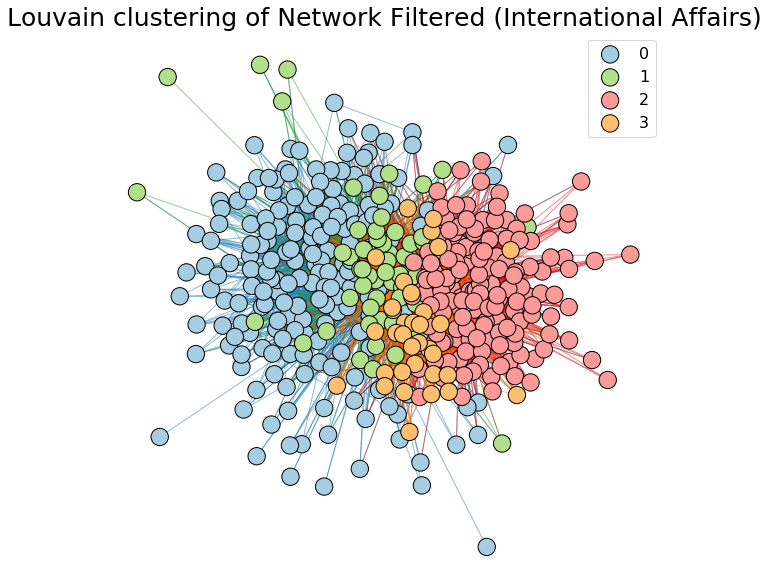

In [52]:
# function for setting colors of nodes and edges
def get_paired_color_palette(size):
    palette = []
    for i in range(size*2):
        palette.append(plt.cm.Paired(i))
    return palette


#use louvain community detection algorithm to detect communities in G
communities =[]
louvain = community.best_partition(Gs, weight = 'weight', random_state=42)
for i in set(louvain.values()):
    nodelist = [n for n in Gs.nodes if (louvain[n]==i)]
    communities.append(nodelist)

#make plot using matplotlib, networkx spring_layout, set_colors using cluster_count and get_paired_color_pallette
clusters_count = len(set(louvain.values()))
plt.figure(figsize=(10, 10))
light_colors = get_paired_color_palette(clusters_count)[0::2]
dark_colors = get_paired_color_palette(clusters_count)[1::2]
g = nx.drawing.layout.spring_layout(Gs, weight = 'weight', seed = 42, threshold = .0000000001)

for i in set(louvain.values()):
    nodelist = [n for n in Gs.nodes if (louvain[n]==i)]
    edgelist = [e for e in Gs.edges if ((louvain[e[0]]==i) or (louvain[e[1]]==i))]
    node_color = [light_colors[i] for _ in range(len(nodelist))]
    edge_color = [dark_colors[i] for _ in range(len(edgelist))]
    nx.draw_networkx_nodes(Gs, g, nodelist=nodelist, node_color=node_color, edgecolors='k', label = i)                                                                                                           
    nx.draw_networkx_edges(Gs, g, edgelist=edgelist, alpha=.5, edge_color=edge_color)

plt.title('Louvain clustering of Network Filtered (' + policy_area + ')', fontdict={'fontsize': 25})
plt.legend()
plt.axis('off')
plt.show()

## List of members not involved in proposal of bills for international affair policies

In [55]:
df = []
for index, row in members.iterrows():
    if index not in communities[0] and index not in communities[1] and index not in communities[2] and index not in communities[3]:
        df.append(row)

df = pd.DataFrame(df) 
df

,name,state,url,chamber,current_party,committee_assignments
G000582,jenniffer-gonzalez-colon,Puerto Rico,https://www.congress.gov/member/jenniffer-gonz...,House,Republican,"[Natural Resources, Transportation and Infrast..."
J000255,walter-jones,North Carolina,https://www.congress.gov/member/walter-jones/J...,House,Republican,[]
M001179,tom-marino,Pennsylvania,https://www.congress.gov/member/tom-marino/M00...,House,Republican,[]
N000147,eleanor-norton,District of Columbia,https://www.congress.gov/member/eleanor-norton...,House,Democratic,"[Oversight and Reform, Transportation and Infr..."
P000197,nancy-pelosi,California,https://www.congress.gov/member/nancy-pelosi/P...,House,Democratic,[The Speaker]
P000610,stacey-plaskett,Virgin Islands,https://www.congress.gov/member/stacey-plasket...,House,Democratic,"[Agriculture, Oversight and Reform, Transporta..."
R000600,aumua-amata-radewagen,American Samoa,https://www.congress.gov/member/aumua-amata-ra...,House,Republican,"[Natural Resources, Small Business, Veterans' ..."
S001177,gregorio-sablan,Northern Mariana Islands,https://www.congress.gov/member/gregorio-sabla...,House,Democratic,"[Education and Labor, Natural Resources, Veter..."
S001204,michael-san-nicolas,Guam,https://www.congress.gov/member/michael-san-ni...,House,Democratic,"[Financial Services, Natural Resources]"


## Key Player Detection (Closeness Centrality)

In [58]:
#set community of interest
community_of_interest = 0

#subgraph: is a subgraph using only nodes contained by the community_of_interest
subgraph = MDs.subgraph(communities[community_of_interest])

#dataframe for nodes of the community of interest sorted by in_degree centrality
pd.DataFrame.from_dict(nx.algorithms.centrality.closeness_centrality(subgraph), orient = 'index', columns = ['centrality']).merge(members[['name','current_party', 'committee_assignments']], how = 'outer', left_index = True, right_index = True).sort_values(by= 'centrality',ascending = False).head(10)

,centrality,name,current_party,committee_assignments
S001190,0.898058,bradley-schneider,Democratic,"[Small Business, Ways and Means]"
D000610,0.804348,theodore-deutch,Democratic,"[Ethics, Chair, Foreign Affairs, Judiciary]"
L000562,0.711538,stephen-lynch,Democratic,"[Financial Services, Oversight and Reform, Tra..."
C001109,0.606557,liz-cheney,Republican,"[Armed Services, Natural Resources]"
M001177,0.562310,tom-mcclintock,Republican,"[Judiciary, Natural Resources]"
B001302,0.544118,andy-biggs,Republican,"[Judiciary, Science, Space, and Technology]"
M001198,0.536232,roger-marshall,Republican,"[Agriculture, Science, Space, and Technology]"
G000579,0.524079,mike-gallagher,Republican,"[Armed Services, Transportation and Infrastruc..."
H001065,0.485564,george-holding,Republican,"[Budget, Ethics, Ways and Means]"
M001187,0.475578,mark-meadows,Republican,"[Oversight and Reform, Transportation and Infr..."


## Graph Breakdown

In [59]:
from decimal import Decimal

c0republican = 0
c0democratic = 0
c0independent = 0

c1republican = 0
c1democratic = 0
c1independent = 0

c2republican = 0
c2democratic = 0
c2independent = 0

c3republican = 0
c3democratic = 0
c3independent = 0

count = 0

for index, row in members.iterrows():
    if index in communities[0]:
        count+=1
        if row.current_party == 'Republican':
            c0republican += 1
            
        if row.current_party == 'Democratic':
            c0democratic += 1
            
        if row.current_party == 'Independent':
            c0independent += 1
print("---Community 0---\n\n")
print("Republicans: "+str(c0republican) + "(" + str(round(100*Decimal(c0republican/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Democrats: "+str(c0democratic) + "(" + str(round(100*Decimal(c0democratic/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Independent: "+str(c0independent) + "(" + str(round(100*Decimal(c0independent/(c0republican+c0democratic+c0independent)),1)) + "%)")
print("Total count: "+str(c0republican+c0democratic+c0independent))
print("\n")

for index, row in members.iterrows():
    if index in communities[1]:
        count+=1
        if row.current_party == 'Republican':
            c1republican += 1
            
        if row.current_party == 'Democratic':
            c1democratic += 1
            
        if row.current_party == 'Independent':
            c1independent += 1

print("---Community 1---\n\n")
print("Republicans: "+str(c1republican) + "(" + str(round(100*Decimal(c1republican/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Democrats: "+str(c1democratic) + "(" + str(round(100*Decimal(c1democratic/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Independent: "+str(c1independent) + "(" + str(round(100*Decimal(c1independent/(c1republican+c1democratic+c1independent)),1)) + "%)")
print("Total count: "+str(c1republican+c1democratic+c1independent))
print("\n")

for index, row in members.iterrows():
    if index in communities[2]:
        count+=1
        if row.current_party == 'Republican':
            c2republican += 1
            
        if row.current_party == 'Democratic':
            c2democratic += 1
            
        if row.current_party == 'Independent':
            c2independent += 1

print("---Community 2---\n\n")
print("Republicans: "+str(c2republican) + "(" + str(100*round(Decimal(c2republican/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Democrats: "+str(c2democratic) + "(" + str(100*round(Decimal(c2democratic/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Independent: "+str(c2independent) + "(" + str(100*round(Decimal(c2independent/(c2republican+c2democratic+c2independent)),1)) + "%)")
print("Total count: "+str(c2republican+c2democratic+c2independent))
print("\n")


for index, row in members.iterrows():
    if index in communities[3]:
        count+=1
        if row.current_party == 'Republican':
            c3republican += 1
            
        if row.current_party == 'Democratic':
            c3democratic += 1
            
        if row.current_party == 'Independent':
            c3independent += 1

print("---Community 3---\n\n")
print("Republicans: "+str(c3republican) + "(" + str(100*round(Decimal(c3republican/(c3republican+c3democratic+c3independent)),1)) + "%)")
print("Democrats: "+str(c3democratic) + "(" + str(100*round(Decimal(c3democratic/(c3republican+c3democratic+c3independent)),1)) + "%)")
print("Independent: "+str(c3independent) + "(" + str(100*round(Decimal(c3independent/(c3republican+c3democratic+c3independent)),1)) + "%)")
print("Total count: "+str(c3republican+c3democratic+c3independent))
print("\n")
print("Grand Total:"+str(count))

print("\n\n")
print("---Percentage of parties in different communities---\n\n")
print("Republicans:\n")
print("Total number: " + str(c0republican+c1republican+c2republican+c3republican))
print("Community 0: " + str(c0republican) + "(" + str(round(100*Decimal(c0republican/(c0republican+c1republican+c2republican+c3republican)),1)) + "%)")
print("Community 1: " + str(c1republican) + "(" + str(round(100*Decimal(c1republican/(c0republican+c1republican+c2republican+c3republican)),1)) + "%)")
print("Community 2: " + str(c2republican) + "(" + str(round(100*Decimal(c2republican/(c0republican+c1republican+c2republican+c3republican)),1)) + "%)")
print("Community 3: " + str(c3republican) + "(" + str(round(100*Decimal(c3republican/(c0republican+c1republican+c2republican+c3republican)),1)) + "%)" + "\n")


print("Democrats:\n")
print("Total number: " + str(c0democratic+c1democratic+c2democratic+c3democratic))
print("Community 0: " + str(c0democratic) + "(" + str(round(100*Decimal(c0democratic/(c0democratic+c1democratic+c2democratic+c3democratic)),1)) + "%)")
print("Community 1: " + str(c1democratic) + "(" + str(round(100*Decimal(c1democratic/(c0democratic+c1democratic+c2democratic+c3democratic)),1)) + "%)")
print("Community 2: " + str(c2democratic) + "(" + str(round(100*Decimal(c2democratic/(c0democratic+c1democratic+c2democratic+c3democratic)),1)) + "%)")
print("Community 3: " + str(c3democratic) + "(" + str(round(100*Decimal(c3democratic/(c0democratic+c1democratic+c2democratic+c3democratic)),1)) + "%)" + "\n")

---Community 0---


Republicans: 165(88.7%)
Democrats: 21(11.3%)
Independent: 0(0.0%)
Total count: 186


---Community 1---


Republicans: 31(52.5%)
Democrats: 28(47.5%)
Independent: 0(0.0%)
Total count: 59


---Community 2---


Republicans: 0(0.0%)
Democrats: 155(100.0%)
Independent: 1(0.0%)
Total count: 156


---Community 3---


Republicans: 3(10.0%)
Democrats: 30(90.0%)
Independent: 0(0.0%)
Total count: 33


Grand Total:434



---Percentage of parties in different communities---


Republicans:

Total number: 199
Community 0: 165(82.9%)
Community 1: 31(15.6%)
Community 2: 0(0.0%)
Community 3: 3(1.5%)

Democrats:

Total number: 234
Community 0: 21(9.0%)
Community 1: 28(12.0%)
Community 2: 155(66.2%)
Community 3: 30(12.8%)

